# **Data Preprocessing**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import cv2

import zipfile
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

In [3]:
local_zip = '/content/drive/MyDrive/Copy of Copy of train.zip'
zipref = zipfile.ZipFile(local_zip)
zipref.extractall('/content/Data')

In [21]:
local_zip = '/content/drive/MyDrive/Copy of Copy of test1.zip'
zipref = zipfile.ZipFile(local_zip)
zipref.extractall('/content/Data')

In [22]:
traning_base_dir = '/content/Data/train'
testing_base_dir = '/content/Data/test1'

In [23]:
print("Traning images   : ", len(os.listdir(traning_base_dir)))
print("Testing images   : ", len(os.listdir(testing_base_dir)))

Traning images   :  25000
Testing images   :  12500


In [24]:
print(os.listdir(traning_base_dir)[:5])
print(os.listdir(testing_base_dir)[:5])

['cat.6906.jpg', 'dog.6350.jpg', 'dog.11750.jpg', 'dog.3385.jpg', 'cat.2000.jpg']
['1710.jpg', '204.jpg', '2449.jpg', '719.jpg', '4678.jpg']


# **Exploratory Data Analysis**

(-0.5, 499.5, 373.5, -0.5)

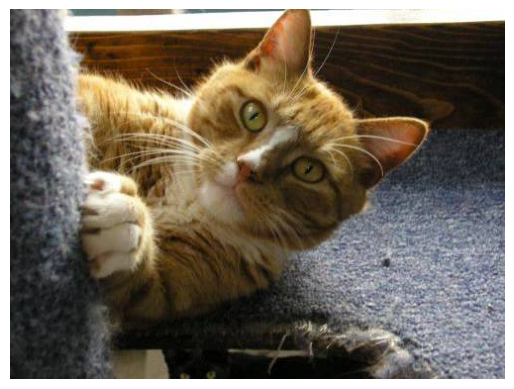

In [25]:
cat_image_path = os.path.join(traning_base_dir,'cat.10862.jpg')
cat_image = mpimg.imread(cat_image_path)

plt.imshow(cat_image)
plt.axis('off')

(-0.5, 499.5, 332.5, -0.5)

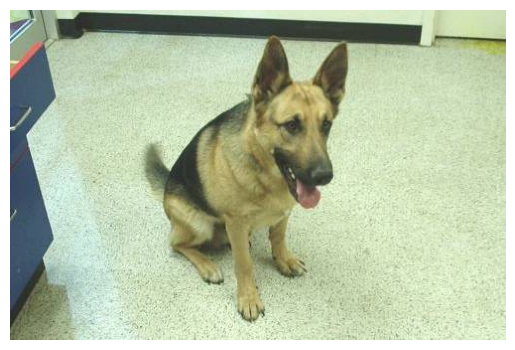

In [26]:
dog_image_path = os.path.join(traning_base_dir,'dog.8105.jpg')
dog_img = mpimg.imread(dog_image_path)

plt.imshow(dog_img)
plt.axis('off')

In [7]:
images = os.listdir(traning_base_dir)[:100]
image_path = [os.path.join(traning_base_dir, image) for image in images]


In [8]:
len(image_path)

100

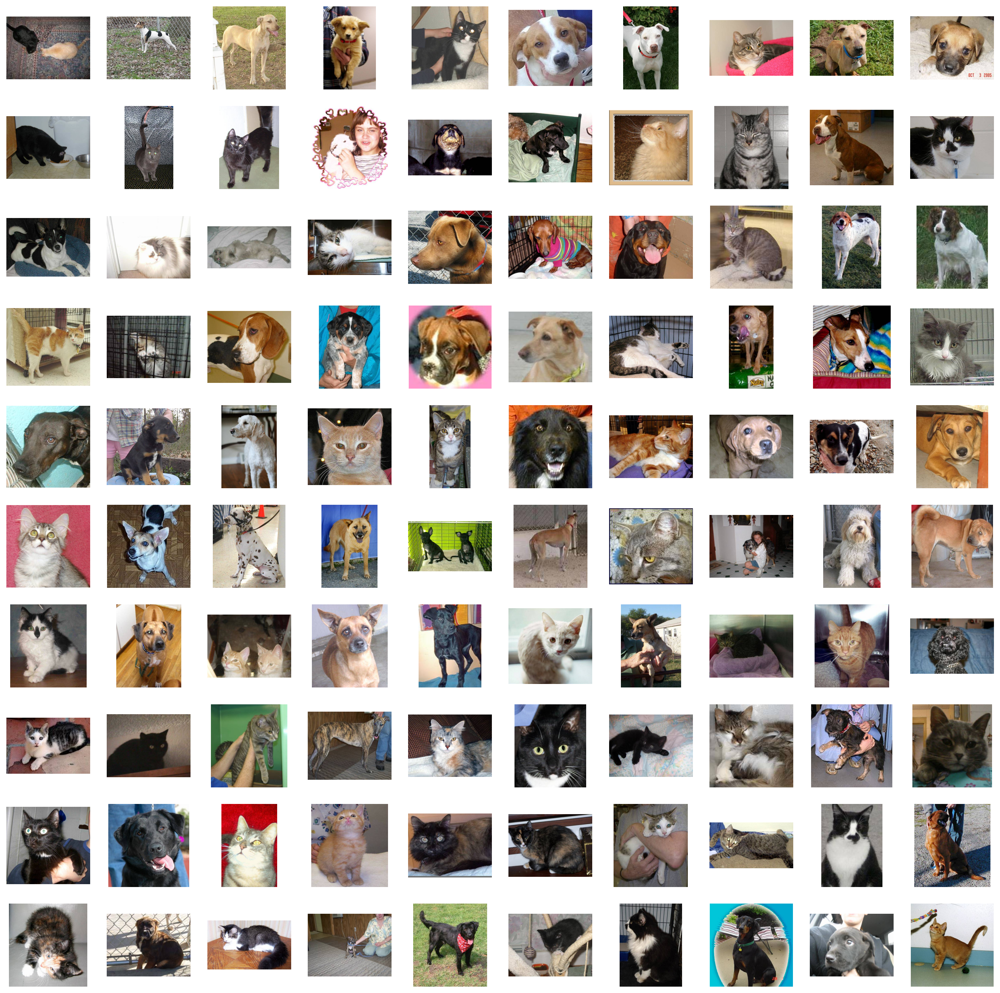

In [9]:
plt.figure(figsize=(20,20), dpi=200)
for i in range(100):
  plt.subplot(10,10,i+1)
  image = mpimg.imread(image_path[i])
  plt.imshow(image)
  plt.axis('off')

In [10]:
def load_images(folder_path):
    images = []
    labels = []
    label_dict = {}
    label_count = 0
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            label = os.path.basename(filename).split('.')[0]
            if label not in label_dict:
                label_dict[label] = label_count
                label_count += 1
            img = cv2.imread(os.path.join(folder_path, filename))
            img = cv2.resize(img, (32, 32))
            images.append(img)
            labels.append(label_dict[label])
    return np.array(images), np.array(labels), label_dict

In [11]:
images, labels, label_dict = load_images('/content/Data/train')
encoded_labels = to_categorical(labels)
X_train, X_val, y_train, y_val = train_test_split(images, encoded_labels, test_size=0.2, random_state=42)


# **Model Traning**

In [12]:
# Data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow(
    X_train, y_train,
    batch_size=32
)

val_generator = val_datagen.flow(
    X_val, y_val,
    batch_size=32
)

In [14]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(32, 32, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(len(label_dict), activation='softmax')
])
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 30, 30, 32)        896       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 15, 15, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 2, 2, 128)         0

In [15]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [16]:
history = model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // 32,
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(X_val) // 32
)

Epoch 1/50
625/625 [==============================] - 29s 38ms/step - loss: 0.6810 - accuracy: 0.5674 - val_loss: 0.6551 - val_accuracy: 0.6080
Epoch 2/50
625/625 [==============================] - 17s 28ms/step - loss: 0.6232 - accuracy: 0.6521 - val_loss: 0.5711 - val_accuracy: 0.7065
Epoch 3/50
625/625 [==============================] - 18s 29ms/step - loss: 0.5936 - accuracy: 0.6787 - val_loss: 0.5429 - val_accuracy: 0.7236
Epoch 4/50
625/625 [==============================] - 17s 28ms/step - loss: 0.5685 - accuracy: 0.7015 - val_loss: 0.6222 - val_accuracy: 0.6733
Epoch 5/50
625/625 [==============================] - 18s 28ms/step - loss: 0.5576 - accuracy: 0.7101 - val_loss: 0.5503 - val_accuracy: 0.7216
Epoch 6/50
625/625 [==============================] - 20s 31ms/step - loss: 0.5474 - accuracy: 0.7232 - val_loss: 0.5667 - val_accuracy: 0.7089
Epoch 7/50
625/625 [==============================] - 19s 30ms/step - loss: 0.5362 - accuracy: 0.7271 - val_loss: 0.4806 - val_accuracy:

# **Model Evaluation**

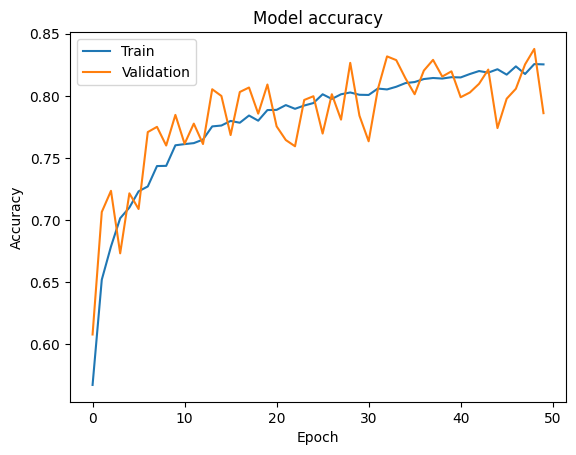

In [17]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

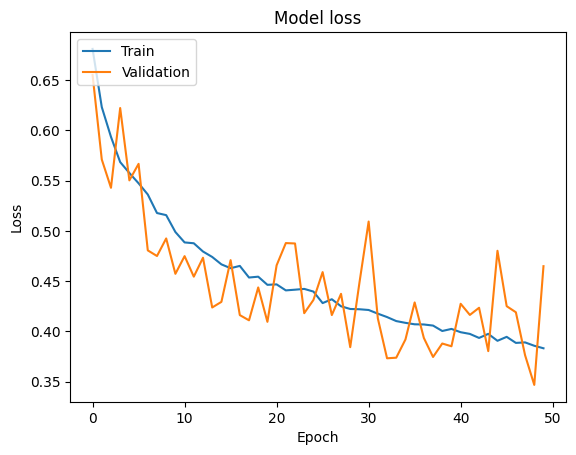

In [18]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

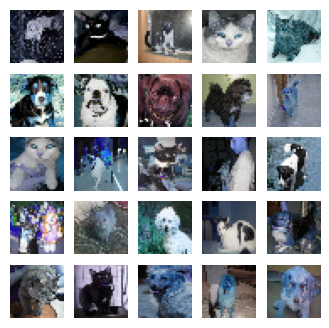

In [30]:
plt.figure(figsize = (4,4))
for i in range(25):
  plt.subplot(5,5, i+1)
  plt.imshow(X_val[i])
  plt.axis('off')

In [36]:
model.predict(X_val[1:2])

1/1 [==============================] - 0s 20ms/step


array([[1., 0.]], dtype=float32)

In [42]:
def predict_img(img):
  processed_image = img/255
  processed_image = processed_image.reshape(1,32,32,3)

  image = model.predict(processed_image)
  predicted_label = np.argmax(image)

  if predicted_label == 0:
    print("Predicted image is Cat")
  else:
    print("Predicted image is Dog")


In [43]:
predict_img(X_val[1:2])

1/1 [==============================] - 0s 29ms/step
Predicted image is Cat


In [39]:
print(labels)

[0 1 1 ... 0 0 0]
